In [ ]:
from glob import glob
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt

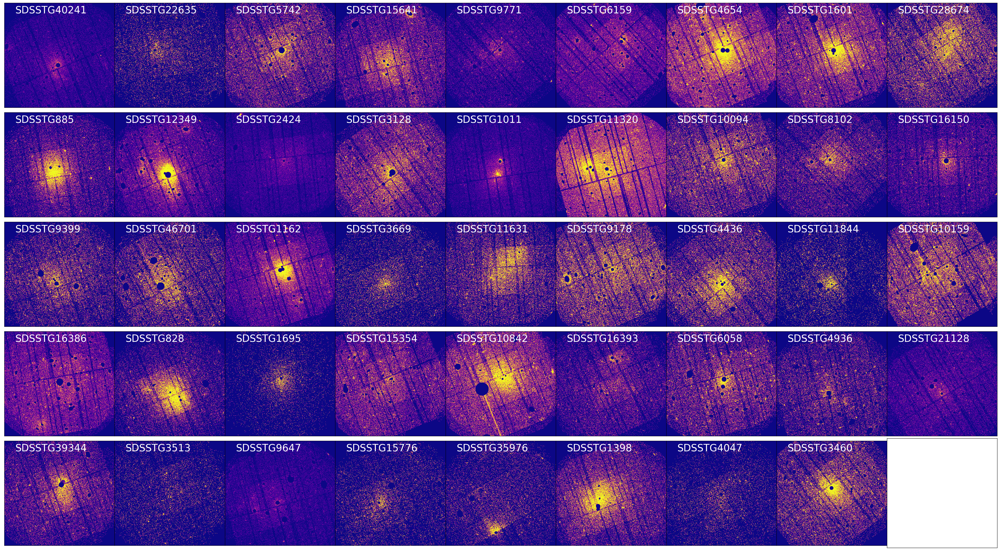

In [53]:
import matplotlib.pyplot as plt
from astropy.io import fits
from glob import glob
from scipy.ndimage import gaussian_filter
import numpy as np
# read data
rootdir = '/Users/eusracenorth/Documents/work/XGAP-ABUN/alldata'
datapath = f'{rootdir}/figs/comb_fits'
dirs = glob(f'{datapath}/SDSSTG*')

fig, axs = plt.subplots(5, 9, figsize=(45, 25), sharex=True, sharey = True)
i = -1
for dir in dirs:
    file = glob(f'{dir}/comb-fovimsky-*_masked.fits')
    
    if file:
        i+=1
        with fits.open(file[0]) as f:
            dat = f[0].data
            imex = (int(i // axs.shape[1]), int(i % axs.shape[1]))
            # Smooth the image using Gaussian filter
            # smoothed_dat = gaussian_filter(dat, sigma=10)
            smoothed_dat = dat
            # Display the smoothed image with plasma colormap
            axs[imex[0], imex[1]].imshow(smoothed_dat, cmap='plasma', vmin = smoothed_dat.min()/2, vmax = smoothed_dat.max()*0.1)
            axs[imex[0], imex[1]].text(0.1,0.9, dir.split('/')[-1], fontsize = 25, transform=axs[imex[0], imex[1]].transAxes, color = 'white')
            # Remove x and y tick labels and ticks
            axs[imex[0], imex[1]].set_xticks([])
            axs[imex[0], imex[1]].set_yticks([])
            axs[imex[0], imex[1]].set_xticklabels([])
            axs[imex[0], imex[1]].set_yticklabels([])
            axs[imex[0], imex[1]].set_ylim(180,750)
            axs[imex[0], imex[1]].set_xlim(150,750)
            axs[imex[0], imex[1]].set_aspect('equal')
plt.subplots_adjust(wspace=0, hspace=0)

# plt.tight_layout()
plt.show()
